In [1]:
from utils.utils import *

structures_path = "1.Minimal_structures/Minimal_structures"

Cif.path = structures_path
Cif.original_cifs_path = "/home/fnerin/Desktop/allodb_new/src/data" # <pdb>_updated.cif.gz

# Data

In [45]:
sitesf = "1.Minimal_structures/sites.pkl"

with open(sitesf, "rb") as f:
    sites = pickle.load(f)

len(sites), sites

(2779,
 {'4r8h': {128: {'mod':   label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
    0           SP1             C               2            .                 ?   
    
      auth_seq_id auth_comp_id auth_asym_id pdbx_PDB_model_num pdbx_label_index  \
    0         301          SP1            A                  1              301   
    
      pdbx_sifts_xref_db_name pdbx_sifts_xref_db_acc pdbx_sifts_xref_db_num  \
    0                       ?                      ?                      ?   
    
      pdbx_sifts_xref_db_res  
    0                      ?  ,
    'site':    label_comp_id label_asym_id label_entity_id label_seq_id pdbx_PDB_ins_code  \
    0            ALA             A               1           49                 ?   
    1            ALA             A               1           97                 ?   
    2            ARG             A               1          136                 ?   
    3            ARG             A               1     

# Clustering

In [2]:
os.makedirs("2.Clustering", exist_ok=True)

## mmseqs2

- Handling multimers as in AlphaFold-Multimer (https://www.biorxiv.org/content/10.1101/2021.10.04.463034v2.full)
- Using PDBx-deposited sequence of each chain-entity

In [3]:
mmseqs_path = "2.Clustering/mmseqs2"
os.makedirs(mmseqs_path, exist_ok=True)

In [4]:
seqsf = "2.Clustering/seqs.pkl"

if not os.path.isfile(seqsf):
    seqs = {
        # Store the sequence of each PDB chain (the sequence of its entity)
        (cif.entry_id, entity_id, asym_id): ent_seq
        # For each Cif object from a .cif file in structures_path
        for pdb in tqdm(os.listdir(structures_path), smoothing=0)
            if pdb.endswith(".cif")
                for cif in (Cif(pdb.replace(".cif", "")),)
                    # For each entity_id that appears in the Cif (will only be of the protein with the site(s))
                    for entity_id, ent_res in cif.residues.groupby("label_entity_id")
                        # Get the PDBx sequence of the entity from the .cif
                        for ent_seq in ((
                            pd.DataFrame(cif.cif.data["_entity_poly"], dtype=str)
                            .query(f"entity_id == '{entity_id}'")
                            .loc[:, "pdbx_seq_one_letter_code_can"].item()
                            .replace("\n", "")
                        ),)
                            for asym_id in ent_res.label_asym_id.unique()
    }
    with open(seqsf, "wb") as f:
        pickle.dump(seqs, f)
else:
    with open(seqsf, "rb") as f:
        seqs = pickle.load(f)

  0%|          | 0/2779 [00:00<?, ?it/s]

In [5]:
len(seqs), seqs

(3518,
 {('5s4x',
   '1',
   'A'): 'MRECISIHVGQAGVQIGNACWELYCLEHGIQPDGQMPSDKTIGGGDDSFNTFFSETGAGKHVPRAVFVDLEPTVIDEVRTGTYRQLFHPEQLITGKEDAANNYARGHYTIGKEIIDLVLDRIRKLADQCTGLQGFLVFHSFGGGTGSGFTSLLMERLSVDYGKKSKLEFSIYPAPQVSTAVVEPYNSILTTHTTLEHSDCAFMVDNEAIYDICRRNLDIERPTYTNLNRLISQIVSSITASLRFDGALNVDLTEFQTNLVPYPRIHFPLATYAPVISAEKAYHEQLSVAEITNACFEPANQMVKCDPRHGKYMACCLLYRGDVVPKDVNAAIATIKTKRSIQFVDWCPTGFKVGINYQPPTVVPGGDLAKVQRAVCMLSNTTAIAEAWARLDHKFDLMYAKRAFVHWYVGEGMEEGEFSEAREDMAALEKDYEEVGVDSVEGEGEEEGEEY',
  ('5s4x',
   '2',
   'B'): 'MREIVHIQAGQCGNQIGAKFWEVISDEHGIDPTGSYHGDSDLQLERINVYYNEATGNKYVPRAILVDLEPGTMDSVRSGPFGQIFRPDNFVFGQSGAGNNWAKGHYTEGAELVDSVLDVVRKESESCDCLQGFQLTHSLGGGTGSGMGTLLISKIREEYPDRIMNTFSVMPSPKVSDTVVEPYNATLSVHQLVENTDETYCIDNEALYDICFRTLKLTTPTYGDLNHLVSATMSGVTTCLRFPGQLNADLRKLAVNMVPFPRLHFFMPGFAPLTSRGSQQYRALTVPELTQQMFDSKNMMAACDPRHGRYLTVAAIFRGRMSMKEVDEQMLNVQNKNSSYFVEWIPNNVKTAVCDIPPRGLKMSATFIGNSTAIQELFKRISEQFTAMFRRKAFLHWYTGEGMDEMEFTEAESNMNDLVSEYQQYQDATADEQGEFEEEEGEDEA',
  ('4ih7',
   '1',
   'A'): 'HMSY

In [6]:
# Write a fasta file of the sequences for mmseqs2
with open(f"{mmseqs_path}/seqs.fasta", "w") as f:
    f.write(
        "\n".join(
            f">{'_'.join(p)}\n" + s
            for p, s in seqs.items()
        )
    )

In [7]:
os.system("mmseqs easy-cluster --help")

usage: mmseqs easy-cluster <i:fastaFile1[.gz|.bz2]> ... <i:fastaFileN[.gz|.bz2]> <o:clusterPrefix> <tmpDir> [options]
 By Martin Steinegger <martin.steinegger@snu.ac.kr>
options: prefilter:                      
 --seed-sub-mat TWIN              Substitution matrix file for k-mer generation [aa:VTML80.out,nucl:nucleotide.out]
 -s FLOAT                         Sensitivity: 1.0 faster; 4.0 fast; 7.5 sensitive [4.000]
 -k INT                           k-mer length (0: automatically set to optimum) [0]
 --target-search-mode INT         target search mode (0: regular k-mer, 1: similar k-mer) [0]
 --k-score TWIN                   k-mer threshold for generating similar k-mer lists [seq:2147483647,prof:2147483647]
 --alph-size TWIN                 Alphabet size (range 2-21) [aa:21,nucl:5]
 --max-seqs INT                   Maximum results per query sequence allowed to pass the prefilter (affects sensitivity) [20]
 --split INT                      Split input into N equally distributed chunks. 0

0

Given the relative small size of the database and the availability of resources, the maximum sensitivity is going to be used (7.5), also --cov-mode is set to 1 and as a consequence --cluster-mode to the recommended 2 (CD-HIT analogue: https://github.com/soedinglab/MMseqs2/wiki#how-to-set-the-right-alignment-coverage-to-cluster). Cascade clustering (default, https://github.com/soedinglab/MMseqs2/wiki#cascaded-clustering) is used, with the maximum available re-clustering/cascade steps (9) and allowing for cluster reassignment of sequences after each step to prevent badly clustered sequences. Finally, the alignment requirements of minimum sequence identity and alignment coverage (% of query covered by target) were set to 0.4 and 0.7, respectively, to obtain a clustering where the most similar representatives were reasonably dissimilar.

<br>

In [8]:
os.system(f"mmseqs easy-cluster {mmseqs_path}/seqs.fasta {mmseqs_path}/clusters {mmseqs_path}/tmp -s 7.5 --dbtype 1 --cluster-steps 9 --cluster-reassign 1 --cov-mode 1 --cluster-mode 2 --min-seq-id 0.4 -c 0.7")

Create directory 2.Clustering/mmseqs2/tmp
easy-cluster 2.Clustering/mmseqs2/seqs.fasta 2.Clustering/mmseqs2/clusters 2.Clustering/mmseqs2/tmp -s 7.5 --dbtype 1 --cluster-steps 9 --cluster-reassign 1 --cov-mode 1 --cluster-mode 2 --min-seq-id 0.4 -c 0.7 

MMseqs Version:                     	15.6f452
Substitution matrix                 	aa:blosum62.out,nucl:nucleotide.out
Seed substitution matrix            	aa:VTML80.out,nucl:nucleotide.out
Sensitivity                         	7.5
k-mer length                        	0
Target search mode                  	0
k-score                             	seq:2147483647,prof:2147483647
Alphabet size                       	aa:21,nucl:5
Max sequence length                 	65535
Max results per query               	20
Split database                      	0
Split mode                          	2
Split memory limit                  	0
Coverage threshold                  	0.7
Coverage mode                       	1
Compositional bias                  	1

0

In [9]:
mmseqs = pd.read_csv(f"{mmseqs_path}/clusters_cluster.tsv", sep="\t", header=None)
mmseqs

,0,1
0,5s4x_1_A,5s4x_1_A
1,5s4x_1_A,5s4x_2_B
2,5s4x_1_A,5s4t_2_B
3,5s4x_1_A,5s4s_1_A
4,5s4x_1_A,5s4s_2_B
...,...,...
3513,8fe1_2_E,8fe1_1_B
3514,8fe1_2_E,8fe1_1_C
3515,4op0_1_A,4op0_1_A
3516,2be9_2_B,2be9_2_B


In [10]:
# Number of cluster representatives (first column) and cluster members (should be all passed sequences)

mmseqs[0].unique().shape, mmseqs[1].unique().shape, len(seqs)

((452,), (3518,), 3518)

In [11]:
# Map each cluster rep to a unique cluster ID
mmseq_ids = {cid: i for i, cid in enumerate(mmseqs[0].unique())}
mmseq_ids

{'5s4x_1_A': 0,
 '5kwj_1_B': 1,
 '6t4k_1_A': 2,
 '5mo6_1_B': 3,
 '3o0n_1_A': 4,
 '1tjp_1_A': 5,
 '2nw8_1_A': 6,
 '4bqh_1_A': 7,
 '1og0_1_A': 8,
 '3s8b_1_A': 9,
 '6ncf_1_B': 10,
 '5jv1_1_A': 11,
 '3auy_1_A': 12,
 '5dl1_1_M': 13,
 '7bhu_1_A': 14,
 '1qqb_2_B': 15,
 '2p5m_1_A': 16,
 '6hgj_1_A': 17,
 '6hgj_2_B': 18,
 '4aau_1_E': 19,
 '5ezv_3_E': 20,
 '6pp9_2_B': 21,
 '4mbs_1_A': 22,
 '6nzf_1_A': 23,
 '3zkr_1_H': 24,
 '5uyy_1_A': 25,
 '5xez_1_A': 26,
 '2b08_1_A': 27,
 '2c2b_1_A': 28,
 '1raf_2_B': 29,
 '5mfv_1_A': 30,
 '2xje_1_A': 31,
 '3i0s_1_A': 32,
 '4dpq_1_A': 33,
 '2d5x_2_B': 34,
 '7amj_1_A': 35,
 '2qmx_1_A': 36,
 '3e5u_1_A': 37,
 '6q4k_1_A': 38,
 '4bo1_1_A': 39,
 '6mo1_1_A': 40,
 '2him_1_A': 41,
 '2poc_1_A': 42,
 '5ja7_1_A': 43,
 '6rkw_1_A': 44,
 '5aa4_1_A': 45,
 '4yw8_1_A': 46,
 '5fts_1_A': 47,
 '5h08_1_A': 48,
 '5olk_1_A': 49,
 '3kq7_1_A': 50,
 '2qei_1_A': 51,
 '8jii_5_E': 52,
 '3u18_1_A': 53,
 '5y66_1_A': 54,
 '6pgr_1_A': 55,
 '2ha2_1_A': 56,
 '5dzh_1_A': 57,
 '7anw_1_A': 58,
 '6kx3_

### Heteromers

In [12]:
# Define each PDB (not each sequence) by the cluster IDs to which the sequences of its chains belong to (# of chains per cluster ID for each PDB)
mmer_clust_ids = {}

for i, row in tqdm(mmseqs.iterrows(), smoothing=0):
    p, entity_id, asym_id = row[1].split("_")
    cid = mmseq_ids[row[0]]
    if p not in mmer_clust_ids:
        mmer_clust_ids[p] = {}
    mmer_clust_ids[p][cid] = mmer_clust_ids[p].get(cid, 0) + 1

mmer_clust_ids

0it [00:00, ?it/s]

{'5s4x': {0: 2},
 '5s4t': {0: 1},
 '5s4s': {0: 2},
 '5s4w': {0: 1},
 '5s4u': {0: 1},
 '5s4q': {0: 1},
 '6ta3': {0: 1, 287: 1},
 '5s4r': {0: 3},
 '5s4z': {0: 2},
 '5kwj': {1: 1},
 '5kwi': {1: 1},
 '6t4k': {2: 1},
 '6t4u': {2: 1},
 '5c4t': {2: 1},
 '5c4o': {2: 1},
 '6t4j': {2: 1},
 '6sal': {2: 1},
 '6t4g': {2: 1},
 '4ypq': {2: 1},
 '6t4i': {2: 1},
 '5lwp': {2: 1},
 '7nec': {2: 1},
 '6tlq': {2: 1},
 '7npc': {2: 1},
 '6t4x': {2: 1},
 '6tlt': {2: 1},
 '7np5': {2: 1},
 '6t4w': {2: 1},
 '7np6': {2: 1},
 '5c4u': {2: 1},
 '6tlm': {2: 1},
 '6t4y': {2: 1},
 '5c4s': {2: 1},
 '6t4t': {2: 1},
 '6ucg': {2: 1},
 '6t50': {2: 1},
 '5mo6': {3: 1},
 '5mmf': {3: 1},
 '5mo7': {3: 1},
 '6gih': {3: 1},
 '6fvg': {3: 1},
 '5otz': {3: 1},
 '5os7': {3: 1},
 '6fvf': {3: 1},
 '6ypk': {3: 1},
 '6gmd': {3: 1},
 '5otr': {3: 1},
 '5osu': {3: 1},
 '3h30': {3: 1},
 '5osr': {3: 1},
 '5ct0': {3: 1},
 '5oue': {3: 1},
 '3o0n': {4: 2},
 '1xjk': {4: 2},
 '3o0q': {4: 2},
 '1xjf': {4: 2},
 '3o0o': {4: 2},
 '1xjg': {4: 2},
 '1xjn

In [13]:
# Dictionary of the heteromers that have sequences from multiple cluster ids
heteromers = tuple((p, tuple(sorted(cids.keys()))) for p, cids in mmer_clust_ids.items() if len(cids) > 1)
heteromers

(('6ta3', (0, 287)),
 ('4wx2', (5, 139)),
 ('6hgj', (17, 18)),
 ('6hgf', (17, 18)),
 ('6hgl', (17, 18)),
 ('6hgk', (17, 18)),
 ('6hgi', (17, 18)),
 ('6hgg', (17, 18)),
 ('4rer', (20, 227)),
 ('4rew', (20, 226)),
 ('4cff', (20, 226, 227)),
 ('4cfe', (20, 226, 227)),
 ('7jv1', (21, 440)),
 ('7m0z', (21, 309)),
 ('7jux', (21, 440)),
 ('7juv', (21, 440)),
 ('6x3t', (92, 186)),
 ('8sgo', (92, 186)),
 ('6huj', (92, 186)),
 ('6hug', (92, 186)),
 ('6x3x', (92, 186)),
 ('8dd2', (92, 186)),
 ('6x40', (92, 186)),
 ('8dd3', (92, 186)),
 ('4mdk', (102, 230)),
 ('5swo', (113, 114)),
 ('5sxi', (113, 114)),
 ('5swg', (113, 114)),
 ('5swr', (113, 114)),
 ('5sxd', (113, 114)),
 ('3kjn', (122, 246)),
 ('3kjq', (122, 246)),
 ('6usa', (138, 139)),
 ('5tcj', (138, 139)),
 ('6u6c', (138, 139)),
 ('5tci', (138, 139)),
 ('6cwy', (160, 161)),
 ('6c98', (177, 178)),
 ('6c99', (177, 178)),
 ('5v03', (199, 200)),
 ('5v02', (199, 200)),
 ('8jr9', (205, 394)),
 ('7c7q', (214, 445)),
 ('6uo8', (214, 445)),
 ('7ca3', 

In [14]:
# Which heteromers share a cluster id of one of its monomers with other heteromers (or not)
heteromers_reps = {}

for cids in set(cs for p, cs in heteromers):
    d = {
        cids: [],
        **{c: [] for c in cids}
    }
    for p, cs in heteromers:
        if cids == cs:
            d[cids].append(p)
        else:
            for c in (c for c in cs if c in cids):
                d[c].append((p, cs))
        
    heteromers_reps[cids] = d

heteromers_reps

{(102, 230): {(102, 230): ['4mdk'], 102: [], 230: []},
 (21, 309): {(21, 309): ['7m0z'],
  21: [('7jv1', (21, 440)), ('7jux', (21, 440)), ('7juv', (21, 440))],
  309: []},
 (21, 440): {(21, 440): ['7jv1', '7jux', '7juv'],
  21: [('7m0z', (21, 309))],
  440: []},
 (92,
  186): {(92, 186): ['6x3t',
   '8sgo',
   '6huj',
   '6hug',
   '6x3x',
   '8dd2',
   '6x40',
   '8dd3'], 92: [], 186: []},
 (113, 114): {(113, 114): ['5swo', '5sxi', '5swg', '5swr', '5sxd'],
  113: [],
  114: []},
 (17, 18): {(17, 18): ['6hgj', '6hgf', '6hgl', '6hgk', '6hgi', '6hgg'],
  17: [],
  18: []},
 (20, 227): {(20, 227): ['4rer'],
  20: [('4rew', (20, 226)),
   ('4cff', (20, 226, 227)),
   ('4cfe', (20, 226, 227))],
  227: [('4cff', (20, 226, 227)),
   ('4cfe', (20, 226, 227)),
   ('5kq5', (226, 227)),
   ('5t5t', (226, 227))]},
 (431, 432): {(431, 432): ['6iq4'], 431: [], 432: []},
 (160, 161): {(160, 161): ['6cwy'], 160: [], 161: []},
 (306, 428): {(306, 428): ['1nsg', '4fap', '2fap', '3fap', '1fap'],
  306: [

#### Unique heteromers

In [15]:
# Heteromers and their cluster IDs for which there are no shared sequences between heteromers
unique_heteromers_ids = {
    cids: d[cids] 
    for cids, d in heteromers_reps.items() 
    if all(
        len(v) == 0 
        for k, v in d.items() 
        if type(k) == int
    )
}

unique_heteromers_ids

{(102, 230): ['4mdk'],
 (92, 186): ['6x3t', '8sgo', '6huj', '6hug', '6x3x', '8dd2', '6x40', '8dd3'],
 (113, 114): ['5swo', '5sxi', '5swg', '5swr', '5sxd'],
 (17, 18): ['6hgj', '6hgf', '6hgl', '6hgk', '6hgi', '6hgg'],
 (431, 432): ['6iq4'],
 (160, 161): ['6cwy'],
 (306, 428): ['1nsg', '4fap', '2fap', '3fap', '1fap'],
 (312, 313): ['5icn'],
 (367, 368): ['5iov',
  '6e7u',
  '6e7x',
  '6e7w',
  '5ewl',
  '5kdt',
  '6e7r',
  '5i58',
  '5i59',
  '5jty',
  '6e7s',
  '5tpa',
  '5ewj',
  '5kcj',
  '5i2k',
  '5i56',
  '5h8h',
  '6e7t',
  '5ewm',
  '5i2n',
  '6e7v',
  '5tp9',
  '3qem',
  '5h8q',
  '3qel'],
 (386, 387): ['2fqq'],
 (214, 445): ['7c7q', '6uo8', '7ca3'],
 (122, 246): ['3kjn', '3kjq'],
 (205, 394): ['8jr9'],
 (0, 287): ['6ta3'],
 (199, 200): ['5v03', '5v02'],
 (374, 375): ['5vsw'],
 (177, 178): ['6c98', '6c99']}

In [16]:
# Unique heteromer cluster ids, its pdbs, and the cluster representative PDBs of each of the cluster IDs of the heteromer, which might or might not be a heteromer PDB (might be monomer or homomer)
{
    cids: {
        "pdbs": ps,
        **{
            c: mmseqs.loc[lambda x: x[1] == rev_mmseq_ids[c]][0].item()
            for c in cids
        }
    }
    for rev_mmseq_ids in ({v:k for k,v in mmseq_ids.items()},)
    for cids, ps in unique_heteromers_ids.items()
}

{(102, 230): {'pdbs': ['4mdk'], 102: '3rz3_1_A', 230: '4mdk_2_E'},
 (92,
  186): {'pdbs': ['6x3t',
   '8sgo',
   '6huj',
   '6hug',
   '6x3x',
   '8dd2',
   '6x40',
   '8dd3'], 92: '8oq8_1_A', 186: '6huj_3_C'},
 (113, 114): {'pdbs': ['5swo', '5sxi', '5swg', '5swr', '5sxd'],
  113: '5swo_1_A',
  114: '5swo_2_B'},
 (17, 18): {'pdbs': ['6hgj', '6hgf', '6hgl', '6hgk', '6hgi', '6hgg'],
  17: '6hgj_1_A',
  18: '6hgj_2_B'},
 (431, 432): {'pdbs': ['6iq4'], 431: '6iq4_3_G', 432: '6iq4_4_H'},
 (160, 161): {'pdbs': ['6cwy'], 160: '6cwy_1_A', 161: '6cwy_2_B'},
 (306, 428): {'pdbs': ['1nsg', '4fap', '2fap', '3fap', '1fap'],
  306: '8jd0_1_A',
  428: '1fap_2_B'},
 (312, 313): {'pdbs': ['5icn'], 312: '5icn_1_A', 313: '5icn_2_B'},
 (367,
  368): {'pdbs': ['5iov',
   '6e7u',
   '6e7x',
   '6e7w',
   '5ewl',
   '5kdt',
   '6e7r',
   '5i58',
   '5i59',
   '5jty',
   '6e7s',
   '5tpa',
   '5ewj',
   '5kcj',
   '5i2k',
   '5i56',
   '5h8h',
   '6e7t',
   '5ewm',
   '5i2n',
   '6e7v',
   '5tp9',
   '3qem',


Heteromers tha appear as cluster representatives of at least one (or all) sequence(s) of an heteromer will be prioritized as cluster representatives of the heteromer(s) with the same cluster IDs.

In some cases, the cluster representative of other sequences of an heteromer is not a heteromer pdb. Since these are all heteromers that have no shared cluster reps., the cluster representative of said sequence(s) is going to be a monomer or homomer. Therefore, forcing the use of a heteromer as cluster rep. will also represent the sequences represented by these monomers or homoers, and ensure its representation and uniqueness.

<br>

In [17]:
manual_reps = {
    c: rep[0] if len(rep) else None
    for rev_mmseq_ids in ({v:k for k,v in mmseq_ids.items()},)
        for cids, ps in unique_heteromers_ids.items()
            for rep in (sorted(
                rep
                for rep in (
                    mmseqs.loc[lambda x: x[1] == rev_mmseq_ids[c]][0].item() 
                    for c in cids
                )
                if any(p in rep for p in ps)
            ),)
                for c in cids
}

manual_reps

{102: '4mdk_2_E',
 230: '4mdk_2_E',
 92: '6huj_3_C',
 186: '6huj_3_C',
 113: '5swo_1_A',
 114: '5swo_1_A',
 17: '6hgj_1_A',
 18: '6hgj_1_A',
 431: '6iq4_3_G',
 432: '6iq4_3_G',
 160: '6cwy_1_A',
 161: '6cwy_1_A',
 306: '1fap_2_B',
 428: '1fap_2_B',
 312: '5icn_1_A',
 313: '5icn_1_A',
 367: '5iov_1_A',
 368: '5iov_1_A',
 386: '2fqq_1_A',
 387: '2fqq_1_A',
 214: '7c7q_1_A',
 445: '7c7q_1_A',
 122: '3kjn_2_B',
 246: '3kjn_2_B',
 205: '8jr9_1_A',
 394: '8jr9_1_A',
 0: '6ta3_3_C',
 287: '6ta3_3_C',
 199: '5v03_1_A',
 200: '5v03_1_A',
 374: '5vsw_3_D',
 375: '5vsw_3_D',
 177: '6c98_1_A',
 178: '6c98_1_A'}

Later, it will be needed to override the representatives of these cluster IDs to be these PDBs (disregarding entity_id and asym_id), having all PDBs of these clusters being represented by these heteromer PDBs.

<br>

#### Non-unique heteromers

In [18]:
# Heteromers and their cluster IDs for which there are shared sequences between heteromers
nonunique_heteromers_ids = {
    cids: d[cids] 
    for cids, d in heteromers_reps.items() 
    if any(
        len(v) != 0 
        for k, v in d.items() 
        if type(k) == int
    )
}

nonunique_heteromers_ids

{(21, 309): ['7m0z'],
 (21, 440): ['7jv1', '7jux', '7juv'],
 (20, 227): ['4rer'],
 (138, 139): ['6usa', '5tcj', '6u6c', '5tci'],
 (20, 226): ['4rew'],
 (226, 227): ['5kq5', '5t5t'],
 (20, 226, 227): ['4cff', '4cfe'],
 (5, 139): ['4wx2']}

- Forcing one of the PDBs of (20, 226, 227) as cluster representative allows to group together the PDBs of (20, 226), (20, 227) and (226, 227).
- (21, 309) and (21, 440) share 21.
- (5, 139) and (138, 139) share 139.

<br>

In [19]:
# Non-unique heteromer cluster ids, its pdbs, and the cluster representative PDBs of each of the cluster IDs of the heteromer, which might or might not be a heteromer PDB (might be monomer or homomer)
{
    cids: {
        "pdbs": ps,
        **{
            c: mmseqs.loc[lambda x: x[1] == rev_mmseq_ids[c]][0].item()
            for c in cids
        }
    }
    for rev_mmseq_ids in ({v:k for k,v in mmseq_ids.items()},)
    for cids, ps in nonunique_heteromers_ids.items()
}

{(21, 309): {'pdbs': ['7m0z'], 21: '6pp9_2_B', 309: '4g9c_1_A'},
 (21, 440): {'pdbs': ['7jv1', '7jux', '7juv'],
  21: '6pp9_2_B',
  440: '7juv_1_A'},
 (20, 227): {'pdbs': ['4rer'], 20: '5ezv_3_E', 227: '4cff_2_D'},
 (138, 139): {'pdbs': ['6usa', '5tcj', '6u6c', '5tci'],
  138: '6usa_1_A',
  139: '6usa_2_B'},
 (20, 226): {'pdbs': ['4rew'], 20: '5ezv_3_E', 226: '4cff_1_C'},
 (226, 227): {'pdbs': ['5kq5', '5t5t'], 226: '4cff_1_C', 227: '4cff_2_D'},
 (20, 226, 227): {'pdbs': ['4cff', '4cfe'],
  20: '5ezv_3_E',
  226: '4cff_1_C',
  227: '4cff_2_D'},
 (5, 139): {'pdbs': ['4wx2'], 5: '1tjp_1_A', 139: '6usa_2_B'}}

In [20]:
# Nonunique heteromer cluster IDs and heteromer PDBs that are cluster representatives of at least one of the clusters contained in the heteromer
{
    cids: rep
    for rev_mmseq_ids in ({v:k for k,v in mmseq_ids.items()},)
    for cids, ps in nonunique_heteromers_ids.items()
    for rep in (sorted(
        rep
        for rep in (
            mmseqs.loc[lambda x: x[1] == rev_mmseq_ids[c]][0].item() 
            for c in cids
        )
        if any(p in rep for p in ps)
    ),)
}

{(21, 309): [],
 (21, 440): ['7juv_1_A'],
 (20, 227): [],
 (138, 139): ['6usa_1_A', '6usa_2_B'],
 (20, 226): [],
 (226, 227): [],
 (20, 226, 227): ['4cff_1_C', '4cff_2_D'],
 (5, 139): []}

- The nonunique heteromer cluster IDs that do not have a representative among them have another group of cluster IDs with at least one ID in common that does have a heteromer PDB as representative: e.g., (21, 440) in comparison to (21, 309).
- Therefore, to maximize the use of heteromer cluster representatives, the representatives found here will be chosen. The cluster IDs of the heteromers without a direct representative that are not represented by the chosen heteromer cluster IDs (because they are not in common with the cluster IDs of the heteromer chosen as representative) will keep their original representative. After the steps taken previously, this original representative is ensured to be a monomer or a homomer: e.g., in (21, 309)-(21, 440), (21, 440): ['7juv_1_A'] will be chosen as representative and 309 will be represented by monomer '4g9c_1_A'.
- For (20, 226, 227), all (20, 226), (20, 227) and (226, 227) are covered.

<br>

In [21]:
manual_reps.update({
    **{
        c: '4cff_1_C' for c in (20, 226, 227)
    },
    **{
        c: '7juv_1_A' for c in (21, 440)
    },
    **{
        c: '6usa_1_A' for c in (138, 139)
    }
})

manual_reps

{102: '4mdk_2_E',
 230: '4mdk_2_E',
 92: '6huj_3_C',
 186: '6huj_3_C',
 113: '5swo_1_A',
 114: '5swo_1_A',
 17: '6hgj_1_A',
 18: '6hgj_1_A',
 431: '6iq4_3_G',
 432: '6iq4_3_G',
 160: '6cwy_1_A',
 161: '6cwy_1_A',
 306: '1fap_2_B',
 428: '1fap_2_B',
 312: '5icn_1_A',
 313: '5icn_1_A',
 367: '5iov_1_A',
 368: '5iov_1_A',
 386: '2fqq_1_A',
 387: '2fqq_1_A',
 214: '7c7q_1_A',
 445: '7c7q_1_A',
 122: '3kjn_2_B',
 246: '3kjn_2_B',
 205: '8jr9_1_A',
 394: '8jr9_1_A',
 0: '6ta3_3_C',
 287: '6ta3_3_C',
 199: '5v03_1_A',
 200: '5v03_1_A',
 374: '5vsw_3_D',
 375: '5vsw_3_D',
 177: '6c98_1_A',
 178: '6c98_1_A',
 20: '4cff_1_C',
 226: '4cff_1_C',
 227: '4cff_1_C',
 21: '7juv_1_A',
 440: '7juv_1_A',
 138: '6usa_1_A',
 139: '6usa_1_A'}

### Processing

In [22]:
# Assigning the new cluster representative PDBs (disregard the entity ID and chain ID)
final_mmseq_ids = pd.DataFrame([
    {
        "old_cluster_id": v,
        "old_cluster_rep": k,
        "cluster_rep": newrep,
        "member": member
    }
    for k, v in mmseq_ids.items()
    for newrep in (k if v not in manual_reps else manual_reps[v],)
    for member in mmseqs.loc[lambda x: x[0] == k][1]
])

final_mmseq_ids

,old_cluster_id,old_cluster_rep,cluster_rep,member
0,0,5s4x_1_A,6ta3_3_C,5s4x_1_A
1,0,5s4x_1_A,6ta3_3_C,5s4x_2_B
2,0,5s4x_1_A,6ta3_3_C,5s4t_2_B
3,0,5s4x_1_A,6ta3_3_C,5s4s_1_A
4,0,5s4x_1_A,6ta3_3_C,5s4s_2_B
...,...,...,...,...
3513,448,8fe1_2_E,8fe1_2_E,8fe1_1_B
3514,448,8fe1_2_E,8fe1_2_E,8fe1_1_C
3515,449,4op0_1_A,4op0_1_A,4op0_1_A
3516,450,2be9_2_B,2be9_2_B,2be9_2_B


In [23]:
# sanity check; this heteromer PDB was chosen as representative of 2 different original cluster IDs
final_mmseq_ids.loc[lambda x: x["cluster_rep"] == '6usa_1_A']

,old_cluster_id,old_cluster_rep,cluster_rep,member
1649,138,6usa_1_A,6usa_1_A,6usa_1_A
1650,138,6usa_1_A,6usa_1_A,5tcj_1_A
1651,138,6usa_1_A,6usa_1_A,6u6c_1_C
1652,138,6usa_1_A,6usa_1_A,5tci_1_G
1653,139,6usa_2_B,6usa_1_A,6usa_2_B
1654,139,6usa_2_B,6usa_1_A,5tcj_2_B
1655,139,6usa_2_B,6usa_1_A,6u6c_2_D
1656,139,6usa_2_B,6usa_1_A,4wx2_2_B
1657,139,6usa_2_B,6usa_1_A,5tci_2_H


In [24]:
final_mmseq_ids['cluster_id'] = final_mmseq_ids['cluster_rep'].map({g: i for i, g in enumerate(final_mmseq_ids['cluster_rep'].unique())})
final_mmseq_ids['pdb'] = final_mmseq_ids['cluster_rep'].apply(lambda x: x.split("_")[0])

final_mmseq_ids

,old_cluster_id,old_cluster_rep,cluster_rep,member,cluster_id,pdb
0,0,5s4x_1_A,6ta3_3_C,5s4x_1_A,0,6ta3
1,0,5s4x_1_A,6ta3_3_C,5s4x_2_B,0,6ta3
2,0,5s4x_1_A,6ta3_3_C,5s4t_2_B,0,6ta3
3,0,5s4x_1_A,6ta3_3_C,5s4s_1_A,0,6ta3
4,0,5s4x_1_A,6ta3_3_C,5s4s_2_B,0,6ta3
...,...,...,...,...,...,...
3513,448,8fe1_2_E,8fe1_2_E,8fe1_1_B,427,8fe1
3514,448,8fe1_2_E,8fe1_2_E,8fe1_1_C,427,8fe1
3515,449,4op0_1_A,4op0_1_A,4op0_1_A,428,4op0
3516,450,2be9_2_B,2be9_2_B,2be9_2_B,429,2be9


In [25]:
# ORIGINAL Number of cluster representatives (first column) and cluster members (should be all passed sequences)
mmseqs[0].unique().shape, mmseqs[1].unique().shape, len(seqs)

((452,), (3518,), 3518)

In [27]:
# FINAL Number of cluster IDs, cluster representative PDBs, and cluster members (should be all passed sequences)

final_mmseq_ids["cluster_id"].unique().shape, final_mmseq_ids["pdb"].unique().shape, final_mmseq_ids["member"].unique().shape, len(seqs)

((431,), (431,), (3518,), 3518)

In [28]:
final_mmseq_ids.to_pickle(f"{mmseqs_path}/clusters.pkl")

#### Number of chains and residues

In [29]:
mmseq_nres = pd.DataFrame({
    cif.entry_id: {
        "nres": len(cif.residues),
        "nchains": len(cif.residues.label_asym_id.unique())
    }
    for pdb in tqdm(final_mmseq_ids["pdb"].unique(), smoothing=0)
        for cif in (Cif(pdb),)
}).T

mmseq_nres.sort_values(["nchains", "nres"], ascending=False).iloc[:40]

  0%|          | 0/431 [00:00<?, ?it/s]

,nres,nchains
6huj,1691,5
8fe1,1412,4
3fhz,636,4
4lrl,1335,3
3uqd,925,3
4cff,887,3
3nwy,683,3
6x83,414,3
3ho8,1989,2
6rkw,1656,2


array([[<Axes: title={'center': 'nres'}>,
        <Axes: title={'center': 'nchains'}>]], dtype=object)

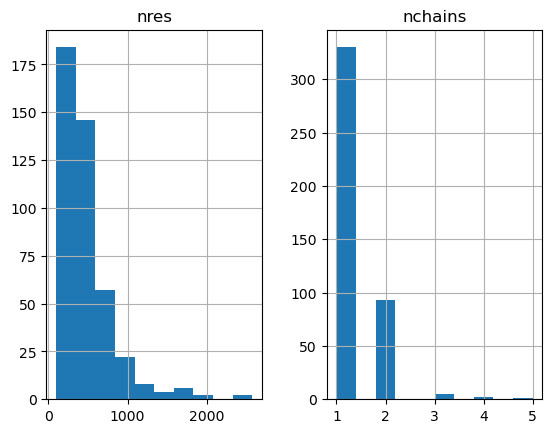

In [30]:
mmseq_nres.hist()

In [31]:
mmseq_nres.loc[lambda x: x["nchains"] > 1].sort_values(["nchains", "nres"], ascending=False)

,nres,nchains
6huj,1691,5
8fe1,1412,4
3fhz,636,4
4lrl,1335,3
3uqd,925,3
...,...,...
5v03,231,2
1fap,202,2
6iq4,201,2
2p5m,161,2


In [32]:
mmseq_nres.sort_values("nres", ascending=False)

,nres,nchains
6s8f,2571,1
7mi6,2419,1
3ho8,1989,2
3cmu,1937,1
5gug,1721,1
...,...,...
6gvt,115,1
6imx,115,1
3u18,114,1
5var,108,1


#### Sequence identities

In [33]:
representatives = final_mmseq_ids.pdb.unique().tolist()

rep_seqs = {
    rep: {
        (e, a): seq
        for (p, e, a), seq in seqs.items()
            if rep == p
    }
    for rep in representatives
}

rep_seqs

{'6ta3': {('2',
   'B'): 'MRECISIHVGQAGVQIGNACWELYCLEHGIQPDGQMPSDKTIGGGDDSFNTFFSETGAGKHVPRAVFVDLEPTVIDEVRTGTYRQLFHPEQLITGKEDAANNYARGHYTIGKEIIDLVLDRIRKLADQCTGLQGFLVFHSFGGGTGSGFTSLLMERLSVDYGKKSKLEFSIYPAPQVSTAVVEPYNSILTTHTTLEHSDCAFMVDNEAIYDICRRNLDIERPTYTNLNRLISQIVSSITASLRFDGALNVDLTEFQTNLVPYPRIHFPLATYAPVISAEKAYHEQLSVAEITNACFEPANQMVKCDPRHGKYMACCLLYRGDVVPKDVNAAIATIKTKRSIQFVDWCPTGFKVGINYQPPTVVPGGDLAKVQRAVCMLSNTTAIAEAWARLDHKFDLMYAKRAFVHWYVGEGMEEGEFSEAREDMAALEKDYEEVGVD',
  ('3',
   'C'): 'MHHHHHHSSGVDLGTENLYFQSMASQPNSSAKKKEEKGKNIQVVVRCRPFNLAERKASAHSIVECDPVRKEVSVRTGGLADKSSRKTYTFDMVFGASTKQIDVYRSVVCPILDEVIMGYNCTIFAYGQTGTGKTFTMEGERSPNEEYTWEEDPLAGIIPRTLHQIFEKLTDNGTEFSVKVSLLEIYNEELFDLLNPSSDVSERLQMFDDPRNKRGVIIKGLEEITVHNKDEVYQILEKGAAKRTTAATLMNAYSSRSHSVFSVTIHMKETTIDGEELVKIGKLNLVDLAGSENIGRSGAVDKRAREAGNINQSLLTLGRVITALVERTPHVPYRESKLTRILQDSLGGRTRTSIIATISPASLNLEETLSTLEYAHRAKNILNKPEVNQKL'},
 '5kwj': {('1',
   'B'): 'MFSRPGLPVEYLQVPSASMGRDIKVQFQGGGPHAVYLLDGLRAQDDYNGWDINTPAFEEYYQSGLSVIMPVGGQSSFYTDWYQPSQSNGQNYTY

In [34]:
from tqdm.contrib.concurrent import process_map
from biotite.sequence import ProteinSequence
from biotite.sequence.align import align_optimal, SubstitutionMatrix, get_sequence_identity

In [49]:
# Sequence identities between cluster representatives
def get_ids(i1, representatives, rep_seqs):
    # For the sequence (index of sequences dict) passed, calculate all sequence identities to the rest of sequences that follow in the dict (higher index)
    return tuple(
        (
            representatives[i1], seqid, representatives[i2], oseqid,
            # Get the sequence identity between the sequences as a mean of all seq. ids. of all alignments returned by align_optimal
            pd.Series((
                get_sequence_identity(al) 
                    for al in align_optimal(
                        ProteinSequence(seq),
                        ProteinSequence(oseq),
                        SubstitutionMatrix.std_protein_matrix(),
                        max_number=10
                    )
            )).mean()
        )
        for seqid, seq in rep_seqs[representatives[i1]].items()
            for i2 in range(i1+1, len(representatives))
                for oseqid, oseq in rep_seqs[representatives[i2]].items()
    )

In [50]:
from functools import partial

In [36]:
ids = pd.DataFrame(
    (
        i
            for l in process_map(
                partial(get_ids, representatives=representatives, rep_seqs=rep_seqs),
                (i1 for i1 in range(len(representatives)-1)),
                tqdm_class=tqdm, 
                max_workers=20, 
                total=len(representatives)-1,
            )
                for i in l
    ),
    columns = ["pdb1", "seqid1", "pdb2", "seqid2", "identity"]
)

ids

  0%|          | 0/430 [00:00<?, ?it/s]

,pdb1,seqid1,pdb2,seqid2,identity
0,6ta3,"(2, B)",5kwj,"(1, B)",0.170320
1,6ta3,"(2, B)",6t4k,"(1, A)",0.199085
2,6ta3,"(2, B)",5mo6,"(1, B)",0.160550
3,6ta3,"(2, B)",3o0n,"(1, A)",0.200591
4,6ta3,"(2, B)",3o0n,"(1, B)",0.200591
...,...,...,...,...,...
147561,8fe1,"(2, E)",2be9,"(2, B)",0.161542
147562,8fe1,"(2, E)",3d2p,"(1, A)",0.174281
147563,4op0,"(1, A)",2be9,"(2, B)",0.172932
147564,4op0,"(1, A)",3d2p,"(1, A)",0.231868


<Axes: >

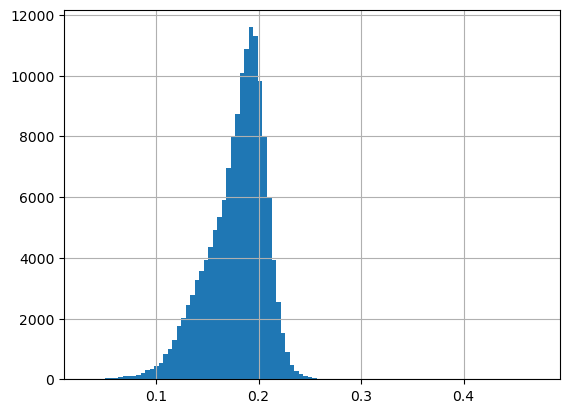

In [37]:
ids.identity.hist(bins=100)

In [38]:
ids.sort_values("identity", ascending=False)

,pdb1,seqid1,pdb2,seqid2,identity
93941,6tpk,"(1, A)",7fee,"(1, A)",0.472098
79690,5x33,"(1, A)",7p2l,"(1, A)",0.435985
133384,5ndz,"(1, A)",6n48,"(1, A)",0.427152
18030,5xez,"(1, A)",5x33,"(1, A)",0.404545
114663,4or2,"(1, A)",7p2l,"(1, A)",0.398877
...,...,...,...,...,...
11064,2p5m,"(1, B)",5gug,"(1, A)",0.039820
10541,2p5m,"(1, A)",5gug,"(1, A)",0.039820
134303,1fap,"(2, B)",7mi6,"(1, A)",0.036550
12144,6hgj,"(2, B)",5vsw,"(3, D)",0.032189


Highest identity is 0.47 and in general the most identical sequences are different GPCRs.

<br>

## foldseek

In [39]:
foldseek_path = "2.Clustering/foldseek"
os.makedirs(foldseek_path, exist_ok=True)

In [40]:
os.system("utils/external/foldseek easy-multimercluster --help")

usage: foldseek easy-multimercluster <i:PDB|mmCIF[.gz]> ... <i:PDB|mmCIF[.gz]> <o:clusterPrefix> <tmpDir> [options]
 By Seongeun  Kim <seamustard52@gmail.com> & Sooyoung Cha <ellen2g77@gmail.com>
options: prefilter:                       
 --comp-bias-corr INT              Correct for locally biased amino acid composition (range 0-1) [1]
 --comp-bias-corr-scale FLOAT      Correct for locally biased amino acid composition (range 0-1) [1.000]
 --seed-sub-mat TWIN               Substitution matrix file for k-mer generation [aa:3di.out,nucl:3di.out]
 -s FLOAT                          Sensitivity: 1.0 faster; 4.0 fast; 7.5 sensitive [4.000]
 -k INT                            k-mer length (0: automatically set to optimum) [0]
 --target-search-mode INT          target search mode (0: regular k-mer, 1: similar k-mer) [0]
 --k-score TWIN                    k-mer threshold for generating similar k-mer lists [seq:2147483647,prof:2147483647]
 --max-seqs INT                    Maximum results per q

0

Same parameters of mmseqs2 are used.

<br>

In [41]:
os.system(f"rm -r {structures_path}/.ipynb_checkpoints")

rm: cannot remove '1.Minimal_structures/Minimal_structures/.ipynb_checkpoints': No such file or directory


256

In [42]:
os.system(f"utils/external/foldseek easy-multimercluster {structures_path}/ {foldseek_path}/clusters {foldseek_path}/tmp -s 7.5 --cov-mode 1 --cluster-mode 2 --multimer-tm-threshold 0.65 --chain-tm-threshold 0.5 --interface-lddt-threshold 0.65 --min-seq-id 0.4 -c 0.7")
# example settings from foldseek repo: --multimer-tm-threshold 0.65 --chain-tm-threshold 0.5 --interface-lddt-threshold 0.65
# parameters from mmseqs2: -s 7.5 --cov-mode 1 --cluster-mode 2 --min-seq-id 0.4 -c 0.7 (--dbtype 1 --cluster-steps 9 --cluster-reassign 1 don't exist)

Create directory 2.Clustering/foldseek/tmp
easy-multimercluster 1.Minimal_structures/Minimal_structures/ 2.Clustering/foldseek/clusters 2.Clustering/foldseek/tmp -s 7.5 --cov-mode 1 --cluster-mode 2 --multimer-tm-threshold 0.65 --chain-tm-threshold 0.5 --interface-lddt-threshold 0.65 --min-seq-id 0.4 -c 0.7 

MMseqs Version:                             	941cd33ff0771cd2e3f144e3293e22a2b87e9fda
Use GPU                                     	0
Path to ProstT5                             	
Chain name mode                             	0
Createdb extraction mode                    	0
Interface distance threshold                	8
Write mapping file                          	0
Mask b-factor threshold                     	0
Coord store mode                            	2
Write lookup file                           	1
Input format                                	0
File Inclusion Regex                        	.*
File Exclusion Regex                        	^$
Threads                               

0

In [43]:
clusters = pd.read_csv(f"{foldseek_path}/clusters_cluster.tsv", sep="\t", header=None)
clusters

,0,1
0,11bg,11bg
1,1abb,1abb
2,1abb,1b4d
3,1abb,1c50
4,1abb,1c8k
...,...,...
2774,8wpg,7dtu
2775,8wpg,7dtv
2776,8wpg,7e6t
2777,8wpg,7sil


In [46]:
# Number of cluster representatives (first column) and cluster members (should be all passed structures)

clusters[0].unique().shape, clusters[1].unique().shape, len(sites)

((478,), (2779,), 2779)

### Sequence identities

In [55]:
representatives = clusters[0].unique().tolist()

rep_seqs = {
    rep: {
        (e, a): seq.replace("U", "X")
        for (p, e, a), seq in seqs.items()
            if rep == p
    }
    for rep in representatives
}

rep_seqs

{'11bg': {('1',
   'A'): 'KESAAAKFERQHMDSGNSPSSSSNYCNLMMCCRKMTQGKCKPVNTFVHESLADVKAVCSQKKVTCKNGQTNCYQSKSTMRITDCRETGSSKYPNCAYKTTQVEKHIIVACGGKPSVPVHFDASV'},
 '1abb': {('1',
   'A'): 'RKQISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNLKDFNVGGYIQAVLDRNLAENISRVLYPNDNFFEGKELRLKQEYFVVAATLQDIIRRFKSSKFGCRDPVRTNFDAFPDKVAIQLNDTHPSLAIPELMRVLVDLERLDWDKAWEVTVKTCAYTNHTVIPEALERWPVHLLETLLPRHLQIIYEINQRFLNRVAAAFPGDVDRLRRMSLVEEGAVKRINMAHLCIAGSHAVNGVARIHSEILKKTIFKDFYELEPHKFQNKTNGITPRRWLVLCNPGLAEIIAERIGEEYISDLDQLRKLLSYVDDEAFIRDVAKVKQENKLKFAAYLEREYKVHINPNSLFDVQVKRIHEYKRQLLNCLHVITLYNRIKKEPNKFVVPRTVMIGGKAAPGYHMAKMIIKLITAIGDVVNHDPVVGDRLRVIFLENYRVSLAEKVIPAADLSEQISTAGTEASGTGNMKFMLNGALTIGTMDGANVEMAEEAGEENFFIFGMRVEDVDRLDQRGYNAQEYYDRIPELRQIIEQLSSGFFSPKQPDLFKDIVNMLMHHDRFKVFADYEEYVKCQERVSALYKNPREWTRMVIRNIATSGKFSSDRTIAQYAREIWGVEP

In [56]:
ids = pd.DataFrame(
    (
        i
            for l in process_map(
                partial(get_ids, representatives=representatives, rep_seqs=rep_seqs),
                (i1 for i1 in range(len(representatives)-1)),
                tqdm_class=tqdm, 
                max_workers=20, 
                total=len(representatives)-1,
            )
                for i in l
    ),
    columns = ["pdb1", "seqid1", "pdb2", "seqid2", "identity"]
)

ids

  0%|          | 0/477 [00:00<?, ?it/s]

,pdb1,seqid1,pdb2,seqid2,identity
0,11bg,"(1, A)",1abb,"(1, A)",0.101346
1,11bg,"(1, A)",1abb,"(1, B)",0.101346
2,11bg,"(1, A)",1bj4,"(1, A)",0.156404
3,11bg,"(1, A)",1bo5,"(1, A)",0.135729
4,11bg,"(1, A)",1bxr,"(1, E)",0.090310
...,...,...,...,...,...
223875,8oq8,"(1, D)",8tb7,"(1, A)",0.165074
223876,8oq8,"(1, D)",8wpg,"(1, A)",0.180288
223877,8oq8,"(1, E)",8tb7,"(1, A)",0.165074
223878,8oq8,"(1, E)",8wpg,"(1, A)",0.180288


<Axes: >

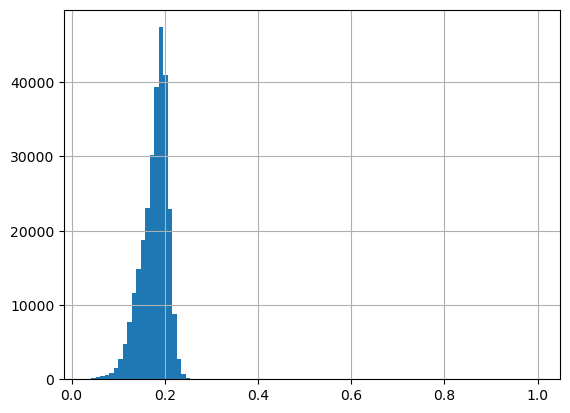

In [156]:
ids.identity.hist(bins=100)

In [157]:
ids.sort_values("identity", ascending=False)

,pdb1,seqid1,pdb2,seqid2,identity
131684,3fhz,"(1, C)",3laj,"(1, A)",1.000000
71530,1zre,"(3, F)",4n9i,"(1, A)",1.000000
244763,5s4r,"(1, C)",6ta3,"(2, B)",1.000000
131139,3fhz,"(1, A)",3laj,"(1, A)",1.000000
127262,3etd,"(1, F)",3ete,"(1, F)",1.000000
...,...,...,...,...,...
14411,1fap,"(2, B)",4w8f,"(1, A)",0.036550
142627,3kjf,"(2, B)",5luq,"(1, A)",0.036429
24357,1i7c,"(1, A)",3cmu,"(2, B)",0.033882
251123,5vsw,"(3, D)",6hgg,"(2, B)",0.032189


Regardless of the many parameter combinations that have been tried, there are always multiple representatives that share a high sequence identity and could lead to data leakage.

<br>

# Conclusion

mmseqs2 will be used.